In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None)
%matplotlib inline

<h1> Objetives</h1>
<ul>
    <li>Understand the CRISP-DM </li>
    <img src="crisp-dm.png">
    
</ul>



<h1> Data Context</h1>

<p> This is the dataset used in the second chapter of "Hands-On Machine Learning with Scikit-Learn and TensorFlow: Concepts, Tools, and Techniques to Build Intelligent Systems" It serves as an excellent introduction to the implementation of machine learning because it is necessary to clean data simpler, has an easy understanding for list of variables and has an optimal size between something very childish or very complicated </p>

<p> The dataset contains information from the 1990 California Census, so even though it may not help much to predict the current price of homes like the Zillow Zestime dataset, it does provide an affordable dataset to teach the basics of machine learning
</p>


<p> The data refer to the houses, each row representing a grouping of houses, found in a given district of California and some summary statistics about them based on the 1990 census data. Understand that the data is not clean, so , some pre-processing steps are required! The columns are as follows, their names are very self-explanatory: </p>
<ul>
    <li>longitude</li>
    <li>latitude</li>
    <li>housingmedianage</li>
    <li>total_rooms</li>
    <li>total_bedrooms</li>
    <li>population</li>
    <li>households</li>
    <li>median_income</li>
    <li>medianhousevalue</li>
    <li>ocean_proximity</li>
</ul>

    
<h3> Acknowledgments </h3>


Pace, R. Kelley, and Ronald Barry. "Sparse spatial autoregressions." Statistics & Probability Letters 33.3 (1997): 291-297.

And also 

"Hands-On Machine Learning with Scikit-Learn and TensorFlow: Concepts, Tools, and Techniques to Build Intelligent Systems " by Aurélien Géron.


https://github.com/ageron/handson-ml2/tree/master/datasets/housing

# 01 - Data Collection 

In [3]:
df_housing = pd.read_csv('./housing.csv')

# 02- Data Exploration (Exploratory Data Analysis)

In [4]:
df_housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [5]:
df_housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [6]:
df_housing.describe().T

,count,mean,std,min,25%,50%,75%,max
longitude,20640.0,-119.569704,2.003532,-124.3500,-121.8000,-118.4900,-118.01000,-114.3100
latitude,20640.0,35.631861,2.135952,32.5400,33.9300,34.2600,37.71000,41.9500
housing_median_age,20640.0,28.639486,12.585558,1.0000,18.0000,29.0000,37.00000,52.0000
total_rooms,20640.0,2635.763081,2181.615252,2.0000,1447.7500,2127.0000,3148.00000,39320.0000
total_bedrooms,20433.0,537.870553,421.385070,1.0000,296.0000,435.0000,647.00000,6445.0000
population,20640.0,1425.476744,1132.462122,3.0000,787.0000,1166.0000,1725.00000,35682.0000
households,20640.0,499.539680,382.329753,1.0000,280.0000,409.0000,605.00000,6082.0000
median_income,20640.0,3.870671,1.899822,0.4999,2.5634,3.5348,4.74325,15.0001
median_house_value,20640.0,206855.816909,115395.615874,14999.0000,119600.0000,179700.0000,264725.00000,500001.0000


#### exploring "ocean_proximity"

In [7]:
df_housing['ocean_proximity'].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

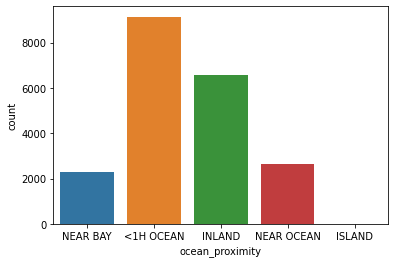

In [8]:
sns.countplot(x = 'ocean_proximity', data = df_housing)

"""
sns.barplot(x = df_housing['ocean_proximity'].value_counts().index,
           y = df_housing['ocean_proximity'].value_counts().values)
""";

#### Histogram of all numerical features

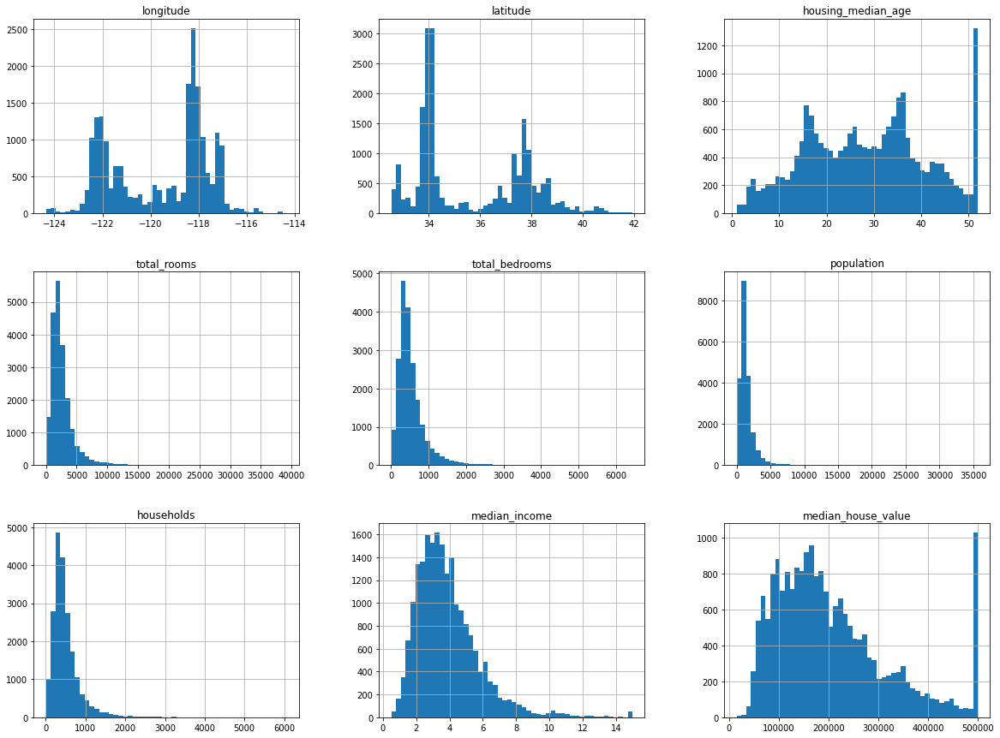

In [9]:
df_housing.hist(bins = 50, figsize = (20,15));

In [ ]:
#obs : renda média não esta em dólares , estão dimensionados e limitados a 15
#obs 2 : idade média e o valor médio foram limitados previsões para valores acima podem não estar precisos
#=====> coletar os dados
#=====> remover os dados
#obs 3 : atributos com valores diferntes precisam de escalonar

# 03- Feature Eng.

### Tranforming a continuous feature into a categorical one (bining)

<AxesSubplot:>

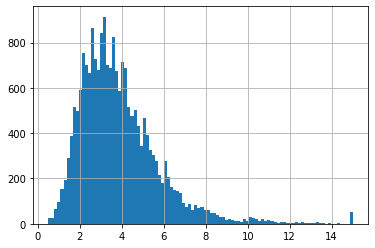

In [10]:
df_housing['median_income'].hist(bins = 100)

In [11]:
df_housing['median_income'].min()

0.4999

In [13]:
df_housing['median_income'].max()

15.0001

ceil round  into the highest integer value ex 0.499 => 1

In [14]:
df_housing['income_disc'] = np.ceil(df_housing['median_income']/1.5)

In [15]:
df_housing['income_disc'].value_counts().sort_index()

1.0      822
2.0     6581
3.0     7236
4.0     3639
5.0     1423
6.0      532
7.0      189
8.0      105
9.0       50
10.0      14
11.0      49
Name: income_disc, dtype: int64

<AxesSubplot:>

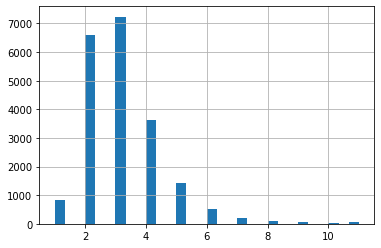

In [17]:
#número discreto
df_housing['income_disc'].hist(bins = 30)

In [18]:
#transform all the values higher than 5 into 5

In [19]:
df_housing['income_disc']=df_housing['income_disc'].where(df_housing['income_disc'] < 5, 5.0)

<AxesSubplot:>

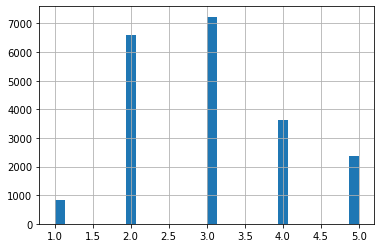

In [20]:
df_housing['income_disc'].hist(bins = 30)

In [21]:
df_housing['income_disc'].value_counts().sort_index()

1.0     822
2.0    6581
3.0    7236
4.0    3639
5.0    2362
Name: income_disc, dtype: int64

In [22]:
#exemplo população Mastercard (desenhar tamanho )

#### DataVis

let's explore a little bit of the latitude and longitude of the dataset

In [23]:
df_housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,income_disc
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,5.0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,5.0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,5.0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,4.0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,3.0
...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND,2.0
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND,2.0
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND,2.0
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND,2.0


<AxesSubplot:xlabel='longitude', ylabel='latitude'>

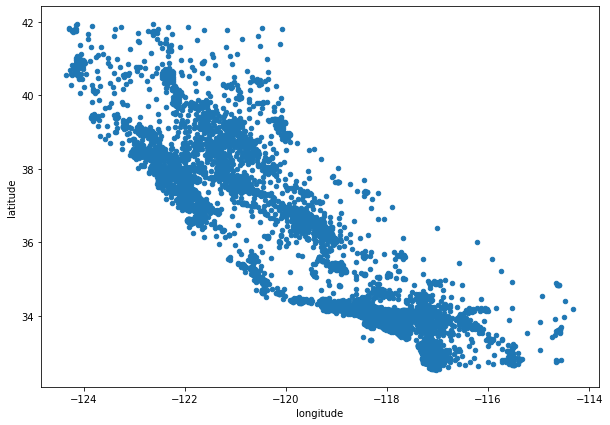

In [25]:
df_housing.plot(kind='scatter', x= 'longitude', y = 'latitude', figsize = (10,7))
# only the general picture

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

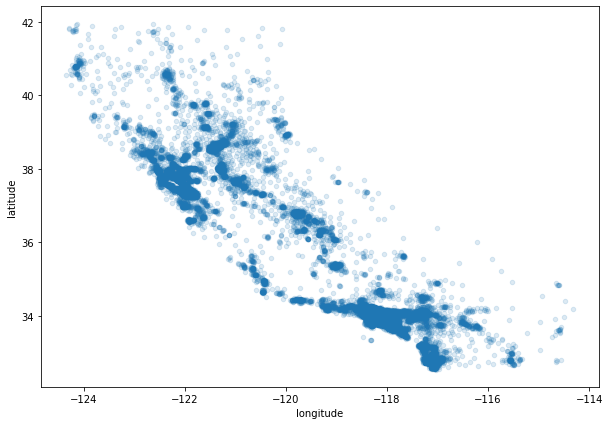

In [26]:
df_housing.plot(kind='scatter', x= 'longitude', y = 'latitude', figsize = (10,7), alpha = 0.15)
#easy to see where there's more points together

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

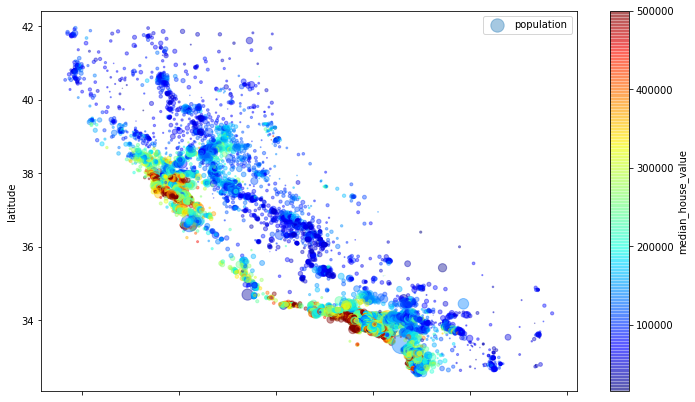

In [26]:
df_housing.plot(kind='scatter', x= 'longitude', y = 'latitude', figsize = (12,7), alpha = 0.4,
                   s = df_housing['population']/100, label = 'population',
                   c = 'median_house_value', cmap = plt.get_cmap('jet'), colorbar = True)

#this way we can see how much the value of the house varies by the color and 
#we also can undertand how the population is clustered by the size of the circles 

#### Correlations

In [27]:
#pearson (-1, 1) => cov(x,y)/(dp(x)*dp(y)
corr_matrix = df_housing.corr()
corr_matrix

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,income_disc
longitude,1.000000,-0.924664,-0.108197,0.044568,0.069608,0.099773,0.055310,-0.015176,-0.045967,-0.010690
latitude,-0.924664,1.000000,0.011173,-0.036100,-0.066983,-0.108785,-0.071035,-0.079809,-0.144160,-0.085528
housing_median_age,-0.108197,0.011173,1.000000,-0.361262,-0.320451,-0.296244,-0.302916,-0.119034,0.105623,-0.146920
total_rooms,0.044568,-0.036100,-0.361262,1.000000,0.930380,0.857126,0.918484,0.198050,0.134153,0.220528
total_bedrooms,0.069608,-0.066983,-0.320451,0.930380,1.000000,0.877747,0.979728,-0.007723,0.049686,0.015662
population,0.099773,-0.108785,-0.296244,0.857126,0.877747,1.000000,0.907222,0.004834,-0.024650,0.025809
households,0.055310,-0.071035,-0.302916,0.918484,0.979728,0.907222,1.000000,0.013033,0.065843,0.038490
median_income,-0.015176,-0.079809,-0.119034,0.198050,-0.007723,0.004834,0.013033,1.000000,0.688075,0.902750
median_house_value,-0.045967,-0.144160,0.105623,0.134153,0.049686,-0.024650,0.065843,0.688075,1.000000,0.643892
income_disc,-0.010690,-0.085528,-0.146920,0.220528,0.015662,0.025809,0.038490,0.902750,0.643892,1.000000


<AxesSubplot:>

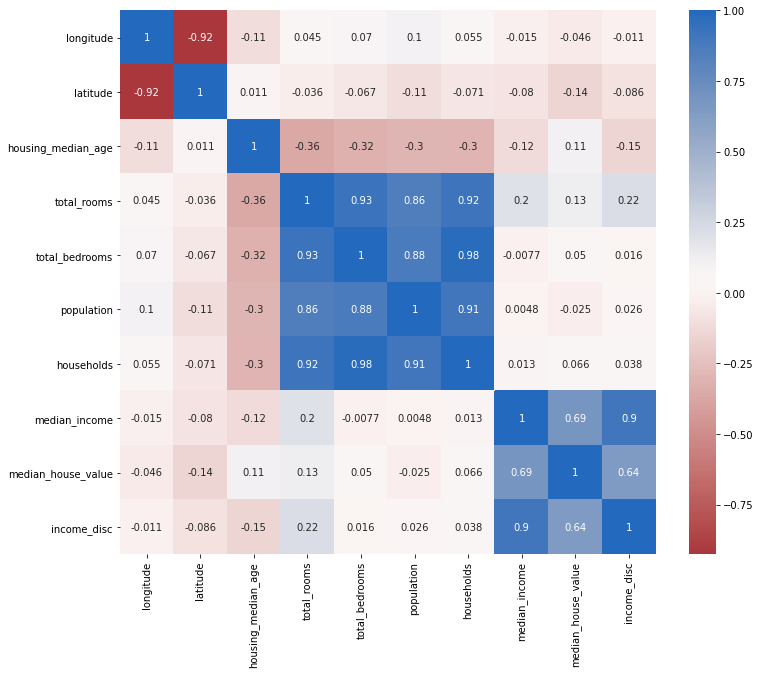

In [28]:
#https://seaborn.pydata.org/tutorial/color_palettes.html

plt.figure(figsize = (12,10))
sns.heatmap(corr_matrix, cmap = 'vlag_r' ,annot = True)
#sns.heatmap(corr_matrix, cmap = 'Spectral' ,annot = True)

In [29]:
# lets focus into the corr with the labels (median_house_value)
corr_matrix['median_house_value'].sort_values(ascending= False)

median_house_value    1.000000
median_income         0.688075
income_disc           0.643892
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049686
population           -0.024650
longitude            -0.045967
latitude             -0.144160
Name: median_house_value, dtype: float64

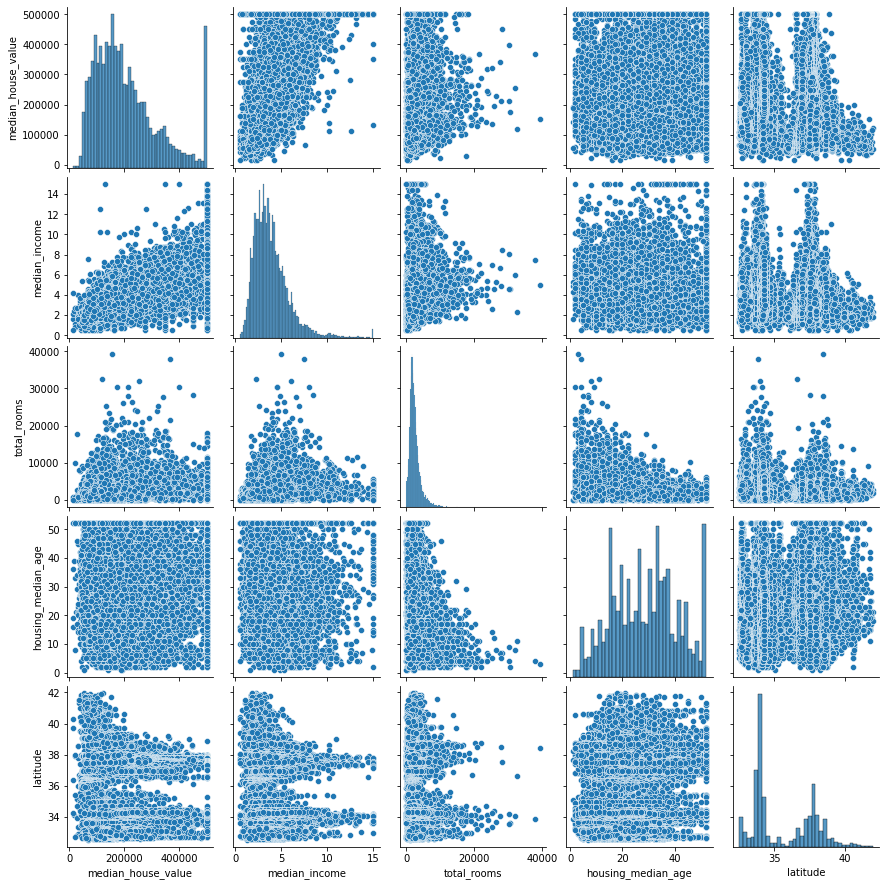

In [30]:
sns.pairplot(df_housing[['median_house_value','median_income','total_rooms', 'housing_median_age', 'latitude']])

In [ ]:
#from pandas.tools.plotting import scatter_matrix

### Mixing features

In [31]:
#
df_housing['rooms_per_household'] = df_housing['total_rooms']/df_housing['households']
#
df_housing['bedrooms_per_room'] = df_housing['total_bedrooms']/df_housing['total_rooms']
#
df_housing['population_per_household'] = df_housing['population']/df_housing['households']

In [32]:
corr_matrix = df_housing.corr()
corr_matrix['median_house_value'].sort_values(ascending = False)

median_house_value          1.000000
median_income               0.688075
income_disc                 0.643892
rooms_per_household         0.151948
total_rooms                 0.134153
housing_median_age          0.105623
households                  0.065843
total_bedrooms              0.049686
population_per_household   -0.023737
population                 -0.024650
longitude                  -0.045967
latitude                   -0.144160
bedrooms_per_room          -0.255880
Name: median_house_value, dtype: float64

### "Automatic" exploratory data analysis ( EDA)

In [33]:
import pandas_profiling

In [34]:
pandas_profiling.ProfileReport(df = df_housing)

# 4 - Data Preparation

In [37]:
df_housing.isnull().sum()

longitude                     0
latitude                      0
housing_median_age            0
total_rooms                   0
total_bedrooms              207
population                    0
households                    0
median_income                 0
median_house_value            0
ocean_proximity               0
income_disc                   0
rooms_per_household           0
bedrooms_per_room           207
population_per_household      0
dtype: int64

a nice way to see where the data is missing, sometimes it might take a long time to plot

<AxesSubplot:>

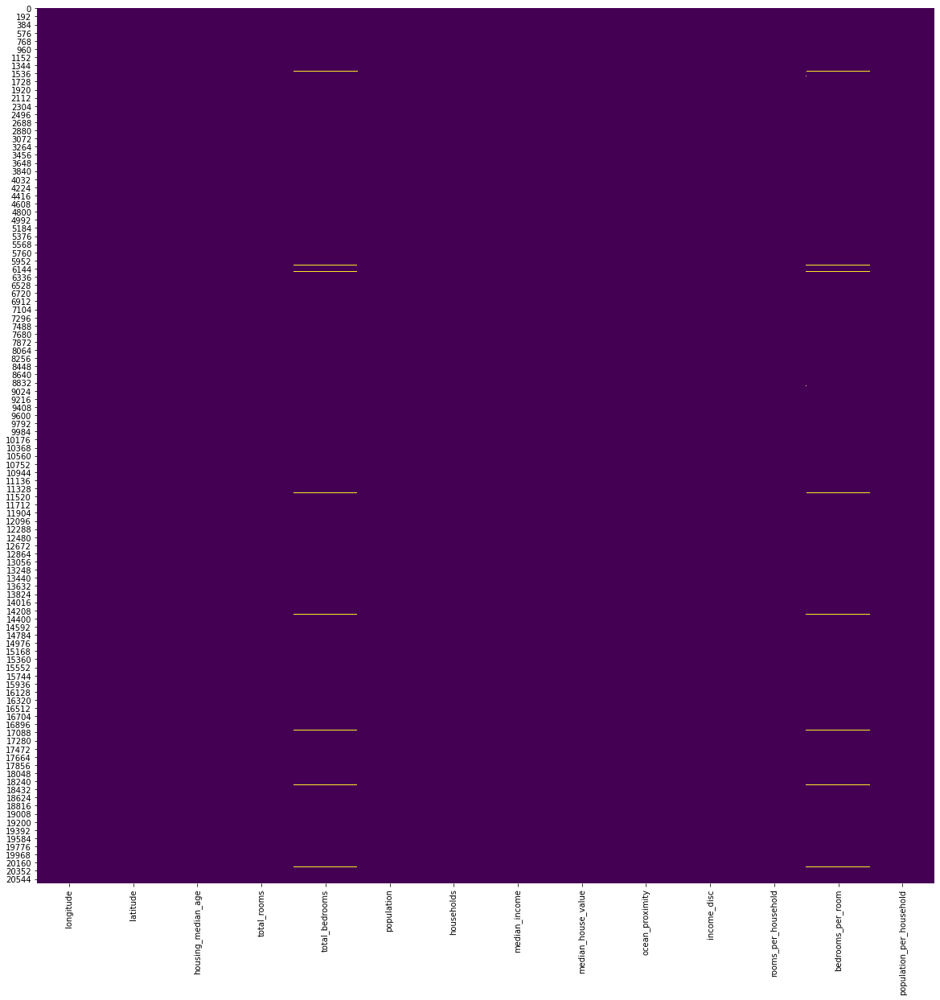

In [38]:
plt.figure(figsize=(20,20))
sns.heatmap(df_housing.isnull(), annot = False, cbar= False, cmap = 'viridis')

### 4.1 Data Cleaning

In [39]:
#tirar do dataset
df_housing.dropna(inplace = True)

In [40]:
df_housing = df_housing.reset_index()
df_housing.drop('index',axis = 1, inplace = True)
#df_housing =df_housing.drop('index',axis = 1)
#df_housing.drop('level_0',axis = 1, inplace = True)
df_housing.columns


Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity', 'income_disc',
       'rooms_per_household', 'bedrooms_per_room', 'population_per_household'],
      dtype='object')

In [ ]:
#preencher média, zero ou outlier
#median_bedrooms = housing_df['total_bedrooms'].median()
#housing['total_bedrooms'] = housing['total_bedrooms'].fillna(median_bedrooms)

###  4.2 Get Dummies / One Hot enconde

In [41]:
df_housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,income_disc,rooms_per_household,bedrooms_per_room,population_per_household
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,5.0,6.984127,0.146591,2.555556
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,5.0,6.238137,0.155797,2.109842
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,5.0,8.288136,0.129516,2.802260
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,4.0,5.817352,0.184458,2.547945
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,3.0,6.281853,0.172096,2.181467
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20428,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND,2.0,5.045455,0.224625,2.560606
20429,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND,2.0,6.114035,0.215208,3.122807
20430,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND,2.0,5.205543,0.215173,2.325635
20431,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND,2.0,5.329513,0.219892,2.123209


In [45]:
df_housing = pd.get_dummies(df_housing, columns = ['ocean_proximity'])

In [46]:
df_housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,income_disc,rooms_per_household,bedrooms_per_room,population_per_household,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,5.0,6.984127,0.146591,2.555556,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,5.0,6.238137,0.155797,2.109842,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,5.0,8.288136,0.129516,2.802260,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,4.0,5.817352,0.184458,2.547945,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,3.0,6.281853,0.172096,2.181467,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20428,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,2.0,5.045455,0.224625,2.560606,0,1,0,0,0
20429,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,2.0,6.114035,0.215208,3.122807,0,1,0,0,0
20430,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,2.0,5.205543,0.215173,2.325635,0,1,0,0,0
20431,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,2.0,5.329513,0.219892,2.123209,0,1,0,0,0


### 4.3 Scalling /StandardScaler

In [47]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler

#MinMaxScaler = Normalization , 0 a 1 (if outlier exists it can descalibrate the model)
#Standard Scaler = padronization , m = 0, std = 1<< model less affected by outliers

In [48]:
df_housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,income_disc,rooms_per_household,bedrooms_per_room,population_per_household,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,5.0,6.984127,0.146591,2.555556,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,5.0,6.238137,0.155797,2.109842,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,5.0,8.288136,0.129516,2.802260,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,4.0,5.817352,0.184458,2.547945,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,3.0,6.281853,0.172096,2.181467,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20428,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,2.0,5.045455,0.224625,2.560606,0,1,0,0,0
20429,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,2.0,6.114035,0.215208,3.122807,0,1,0,0,0
20430,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,2.0,5.205543,0.215173,2.325635,0,1,0,0,0
20431,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,2.0,5.329513,0.219892,2.123209,0,1,0,0,0


In [49]:
#num columns
df_housing_num = df_housing[['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
        'income_disc', 'rooms_per_household',
       'bedrooms_per_room', 'population_per_household',
       ]]

In [50]:
len(df_housing)
#df_housing

20433

In [51]:
#cat columns
df_housing_cat = df_housing[['ocean_proximity_<1H OCEAN', 'ocean_proximity_INLAND',
       'ocean_proximity_ISLAND', 'ocean_proximity_NEAR BAY',
       'ocean_proximity_NEAR OCEAN']]

In [52]:
len(df_housing_cat)

20433

In [53]:
#target
arr_housing_target = df_housing['median_house_value']

In [54]:
len(arr_housing_target)

20433

In [55]:
scaler = StandardScaler()
scaler.fit(df_housing_num)
scaled = scaler.transform(df_housing_num)

In [56]:
df_housing_scaled =pd.DataFrame(scaled,columns = df_housing_num.columns)
#df_housing_scaled

In [57]:
df_housing_transformed = pd.concat([df_housing_scaled, df_housing_cat, arr_housing_target], axis=1)

In [58]:
df_housing_transformed

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,income_disc,rooms_per_household,bedrooms_per_room,population_per_household,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN,median_house_value
0,-1.327314,1.051717,0.982163,-0.803813,-0.970325,-0.973320,-0.976833,2.345163,1.889705,0.625395,-1.146024,-0.049433,0,0,0,1,0,452600.0
1,-1.322323,1.042355,-0.606210,2.042130,1.348276,0.861339,1.670373,2.332632,1.889705,0.324942,-0.987254,-0.092134,0,0,0,1,0,358500.0
2,-1.332305,1.037674,1.855769,-0.535189,-0.825561,-0.819769,-0.843427,1.782939,1.889705,1.150594,-1.440514,-0.025797,0,0,0,1,0,352100.0
3,-1.337296,1.037674,1.855769,-0.623510,-0.718768,-0.765056,-0.733562,0.932970,0.941558,0.155467,-0.492925,-0.050162,0,0,0,1,0,341300.0
4,-1.337296,1.037674,1.855769,-0.461970,-0.611974,-0.758879,-0.628930,-0.013143,-0.006589,0.342549,-0.706141,-0.085272,0,0,0,1,0,342200.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20428,-0.758318,1.800677,-0.288535,-0.444580,-0.388895,-0.511787,-0.443207,-1.216727,-0.954736,-0.155420,0.199820,-0.048949,0,1,0,0,0,78100.0
20429,-0.818212,1.805358,-0.844466,-0.887557,-0.920488,-0.943315,-1.008223,-0.692044,-0.954736,0.274959,0.037412,0.004912,0,1,0,0,0,77100.0
20430,-0.823203,1.777272,-0.923885,-0.175042,-0.125472,-0.368826,-0.173778,-1.143171,-0.954736,-0.090943,0.036808,-0.071460,0,1,0,0,0,92300.0
20431,-0.873115,1.777272,-0.844466,-0.355344,-0.305834,-0.603564,-0.393506,-1.055136,-0.954736,-0.041013,0.118204,-0.090853,0,1,0,0,0,84700.0


### Transformation Function 
<p> Not necessary, but understanding it you can transform the function into a Class method and use it into  a pipeline </p>

In [76]:
def transform(df):
    """
    Função transformação para poder utilizar as variáveis em um modelo de ML
    """
    X_ = df.copy()   
    #Discretização (binning)
    X_['income_disc'] = (X_['median_income']/1.5)
    X_['income_disc'] = X_['income_disc'].where(X_['income_disc'] < 5, 5.0)
    
    #Criação de variáveis
    X_['rooms_per_household'] = X_['total_rooms']/X_['households']
    X_['bedrooms_per_room'] = X_['total_bedrooms']/X_['total_rooms']
    X_['population_per_household'] = X_['population']/X_['households']
    
    #Criação de dummies
    X_ = pd.get_dummies(X_, columns = ['ocean_proximity'])
    
    #Retirando dados nulos
    X_.dropna(inplace = True)
    X_ = X_.reset_index()
    X_ = X_.drop('index', axis = 1)

    #normalização
    df_housing_num = X_[['longitude', 'latitude', 'housing_median_age', 'total_rooms',
                         'total_bedrooms', 'population', 'households', 'median_income',
                         'income_disc', 'rooms_per_household',
                         'bedrooms_per_room', 'population_per_household']]

    df_housing_cat = X_[['ocean_proximity_<1H OCEAN', 'ocean_proximity_INLAND',
                         'ocean_proximity_ISLAND', 'ocean_proximity_NEAR BAY',
                         'ocean_proximity_NEAR OCEAN']]

    arr_housing_target = X_['median_house_value']

    scaler = StandardScaler()
    scaler.fit(df_housing_num)
    scaled = scaler.transform(df_housing_num)


    df_housing_scaled =pd.DataFrame(scaled,columns = df_housing_num.columns)

    df_housing_transformed = pd.concat([df_housing_scaled, df_housing_cat, arr_housing_target], axis=1)

    X_ = df_housing_transformed.copy() 


    return X_

Testing df

In [75]:
df_test = pd.read_csv('./housing.csv')

In [74]:
df_test_t = transform(df_test)
df_test_t

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,income_disc,rooms_per_household,bedrooms_per_room,population_per_household,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN,median_house_value
0,-1.327314,1.051717,0.982163,-0.803813,-0.970325,-0.973320,-0.976833,2.345163,2.310828,0.625395,-1.146024,-0.049433,0,0,0,1,0,452600.0
1,-1.322323,1.042355,-0.606210,2.042130,1.348276,0.861339,1.670373,2.332632,2.310828,0.324942,-0.987254,-0.092134,0,0,0,1,0,358500.0
2,-1.332305,1.037674,1.855769,-0.535189,-0.825561,-0.819769,-0.843427,1.782939,2.160062,1.150594,-1.440514,-0.025797,0,0,0,1,0,352100.0
3,-1.337296,1.037674,1.855769,-0.623510,-0.718768,-0.765056,-0.733562,0.932970,1.156839,0.155467,-0.492925,-0.050162,0,0,0,1,0,341300.0
4,-1.337296,1.037674,1.855769,-0.461970,-0.611974,-0.758879,-0.628930,-0.013143,0.040138,0.342549,-0.706141,-0.085272,0,0,0,1,0,342200.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20428,-0.758318,1.800677,-0.288535,-0.444580,-0.388895,-0.511787,-0.443207,-1.216727,-1.380457,-0.155420,0.199820,-0.048949,0,1,0,0,0,78100.0
20429,-0.818212,1.805358,-0.844466,-0.887557,-0.920488,-0.943315,-1.008223,-0.692044,-0.761172,0.274959,0.037412,0.004912,0,1,0,0,0,77100.0
20430,-0.823203,1.777272,-0.923885,-0.175042,-0.125472,-0.368826,-0.173778,-1.143171,-1.293639,-0.090943,0.036808,-0.071460,0,1,0,0,0,92300.0
20431,-0.873115,1.777272,-0.844466,-0.355344,-0.305834,-0.603564,-0.393506,-1.055136,-1.189731,-0.041013,0.118204,-0.090853,0,1,0,0,0,84700.0


In [62]:
df_housing_transformed

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,income_disc,rooms_per_household,bedrooms_per_room,population_per_household,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN,median_house_value
0,-1.327314,1.051717,0.982163,-0.803813,-0.970325,-0.973320,-0.976833,2.345163,1.889705,0.625395,-1.146024,-0.049433,0,0,0,1,0,452600.0
1,-1.322323,1.042355,-0.606210,2.042130,1.348276,0.861339,1.670373,2.332632,1.889705,0.324942,-0.987254,-0.092134,0,0,0,1,0,358500.0
2,-1.332305,1.037674,1.855769,-0.535189,-0.825561,-0.819769,-0.843427,1.782939,1.889705,1.150594,-1.440514,-0.025797,0,0,0,1,0,352100.0
3,-1.337296,1.037674,1.855769,-0.623510,-0.718768,-0.765056,-0.733562,0.932970,0.941558,0.155467,-0.492925,-0.050162,0,0,0,1,0,341300.0
4,-1.337296,1.037674,1.855769,-0.461970,-0.611974,-0.758879,-0.628930,-0.013143,-0.006589,0.342549,-0.706141,-0.085272,0,0,0,1,0,342200.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20428,-0.758318,1.800677,-0.288535,-0.444580,-0.388895,-0.511787,-0.443207,-1.216727,-0.954736,-0.155420,0.199820,-0.048949,0,1,0,0,0,78100.0
20429,-0.818212,1.805358,-0.844466,-0.887557,-0.920488,-0.943315,-1.008223,-0.692044,-0.954736,0.274959,0.037412,0.004912,0,1,0,0,0,77100.0
20430,-0.823203,1.777272,-0.923885,-0.175042,-0.125472,-0.368826,-0.173778,-1.143171,-0.954736,-0.090943,0.036808,-0.071460,0,1,0,0,0,92300.0
20431,-0.873115,1.777272,-0.844466,-0.355344,-0.305834,-0.603564,-0.393506,-1.055136,-0.954736,-0.041013,0.118204,-0.090853,0,1,0,0,0,84700.0


# 5- Modeling

### Train Test Split

In [77]:
from sklearn.model_selection import train_test_split

In [78]:
X = df_housing_transformed.drop('median_house_value', axis = 1)
y = df_housing_transformed['median_house_value']

In [79]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

### Linear Regression

In [81]:
from sklearn.linear_model import LinearRegression

In [82]:
linear_model = LinearRegression()

In [83]:
linear_model.fit(X_train, y_train)

LinearRegression()

In [84]:
linear_model_preds = linear_model.predict(X_test)

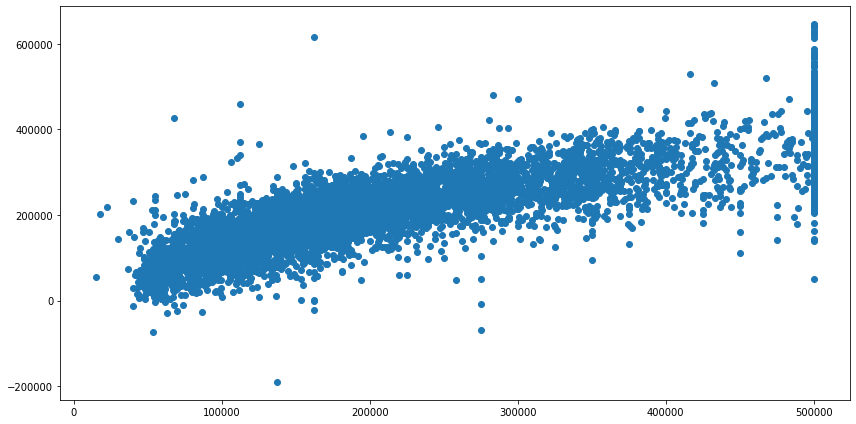

In [85]:
fig, axes = plt.subplots(figsize=(12,6))
plt.scatter(y_test, linear_model_preds )
plt.tight_layout()

## Evaluation Metrics for Regression

here we have 3 methods to evaluate the regression model:



**(Mean Absolute Error-MAE)** 

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$

**(Mean Squared Error- MSE)**

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$

**(Root Mean Squared Error-RMSE)** 

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$

Comparing these metrics:

- **MAE** is the easiest to understand, because it's the average error.
- **MSE** is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
- **RMSE** is even more popular than MSE, because RMSE is interpretable in the "y" units.

All of these are **loss functions**, because we want to minimize them.

In [86]:
from sklearn.metrics import mean_squared_error

In [87]:
linear_model_mse = mean_squared_error(y_test, linear_model_preds)
np.sqrt(linear_model_mse)

66820.3959733099

In [88]:
pct_error = np.sqrt(linear_model_mse)/df_housing_transformed['median_house_value'].max()*100
print('{:.2f} % error'.format(pct_error))

13.36 % error


###  K_fold Cross validation

<img src="k-fold-cross-validation.png">

#### Decision Tree Regressor

In [91]:
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree

In [94]:
tree_regressor = DecisionTreeRegressor()
#tree_regressor.fit(X_train, y_train)

In [95]:
from sklearn.model_selection import cross_val_score

In [96]:
tree_scores = cross_val_score(tree_regressor,
                              X=X,
                              y=y,
                              scoring ="neg_mean_squared_error",
                              cv = 10,
                             n_jobs = -1)

In [97]:
tree_regressor_rmse = np.sqrt(-tree_scores)

In [98]:
tree_regressor_rmse.mean()

86254.46080698472

In [99]:
pct_error = tree_regressor_rmse.mean()/df_housing_transformed['median_house_value'].max()*100
print('{:.2f} % error'.format(pct_error))

17.25 % error


### RandomForestRegressor

In [100]:
from sklearn.ensemble import RandomForestRegressor

In [101]:
forest_regressor = RandomForestRegressor()
forest_scores = cross_val_score(forest_regressor,  X=X,y=y, scoring ="neg_mean_squared_error", cv = 10)

In [102]:
forest_regressor_rmse = np.sqrt(-forest_scores)
np.mean(forest_regressor_rmse)

63653.162855756

In [103]:
pct_error = np.mean(forest_regressor_rmse)/df_housing_transformed['median_house_value'].max()*100
print('{:.2f} % error'.format(pct_error))

12.73 % error


### model optimization

##### Grid Search

In [104]:
from sklearn.model_selection import GridSearchCV

In [105]:
param_grid=[
    {'n_estimators':[3,10,30],
     'max_features':[2,4,6,8]}, #12
    {'bootstrap':[False],
     'n_estimators':[3,10],
     'max_features':[2,3,4]}  #6
]
#12+6=18 total combinations



In [106]:
rf_reg=RandomForestRegressor()

grid_search=GridSearchCV(rf_reg,
                         param_grid,
                         cv=10,
                         scoring='neg_root_mean_squared_error',
                         return_train_score=True,
                        n_jobs = -1)
grid_search.fit(X,y)

GridSearchCV(cv=10, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid=[{'max_features': [2, 4, 6, 8],
                          'n_estimators': [3, 10, 30]},
                         {'bootstrap': [False], 'max_features': [2, 3, 4],
                          'n_estimators': [3, 10]}],
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [107]:
cvres=grid_search.cv_results_
for mean_score,params in zip(cvres['mean_test_score'],cvres['params']):
    print(np.sqrt(-mean_score),params)



276.0373533236309 {'max_features': 2, 'n_estimators': 3}
259.4334390147985 {'max_features': 2, 'n_estimators': 10}
254.09403070314252 {'max_features': 2, 'n_estimators': 30}
270.7641924656378 {'max_features': 4, 'n_estimators': 3}
257.9129707773263 {'max_features': 4, 'n_estimators': 10}
251.43643391730865 {'max_features': 4, 'n_estimators': 30}
266.6177364996196 {'max_features': 6, 'n_estimators': 3}
253.81986538172004 {'max_features': 6, 'n_estimators': 10}
250.19986100802805 {'max_features': 6, 'n_estimators': 30}
269.0349521633073 {'max_features': 8, 'n_estimators': 3}
254.71662809436316 {'max_features': 8, 'n_estimators': 10}
250.93386359902897 {'max_features': 8, 'n_estimators': 30}
271.29416015583973 {'bootstrap': False, 'max_features': 2, 'n_estimators': 3}
256.52385697100505 {'bootstrap': False, 'max_features': 2, 'n_estimators': 10}
271.63035332591977 {'bootstrap': False, 'max_features': 3, 'n_estimators': 3}
255.94403617231816 {'bootstrap': False, 'max_features': 3, 'n_estim

In [108]:
grid_search.best_estimator_

RandomForestRegressor(max_features=6, n_estimators=30)

In [109]:
grid_search.best_params_

{'max_features': 6, 'n_estimators': 30}

In [110]:
-grid_search.best_score_

62599.97044843655

#### Randomized Search 

In [111]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

In [112]:
param_dist = {
        'n_estimators': randint(1, 200),
        'max_features': randint(1, 8)
    }



In [113]:
rf_reg=RandomForestRegressor()

random_search = RandomizedSearchCV(rf_reg,
                                   param_distributions=param_dist,
                                   n_iter=10,
                                   cv=5,
                                   scoring='neg_root_mean_squared_error', 
                                  n_jobs = -1)
random_search.fit(X, y)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000025E857EC820>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000025E858333D0>},
                   scoring='neg_root_mean_squared_error')

In [114]:
random_search.best_estimator_


RandomForestRegressor(max_features=5, n_estimators=160)

In [115]:
cvres=random_search.cv_results_
for mean_score,params in zip(cvres['mean_test_score'],cvres['params']):
    print(np.sqrt(-mean_score),params)

257.97829014328477 {'max_features': 4, 'n_estimators': 127}
257.8625734597046 {'max_features': 5, 'n_estimators': 160}
260.08966695039635 {'max_features': 7, 'n_estimators': 149}
260.28881602843404 {'max_features': 6, 'n_estimators': 86}
257.9900071342553 {'max_features': 3, 'n_estimators': 194}
258.72248644914924 {'max_features': 7, 'n_estimators': 173}
258.4576225312204 {'max_features': 7, 'n_estimators': 65}
260.0948380872852 {'max_features': 6, 'n_estimators': 95}
261.6834728073066 {'max_features': 1, 'n_estimators': 182}
262.7626751657943 {'max_features': 1, 'n_estimators': 50}


In [116]:
-grid_search.best_score_

-62599.97044843655

### Feature Importances

In [117]:
grid_search.best_estimator_.feature_importances_

array([0.07694234, 0.06553524, 0.04305715, 0.01699174, 0.01713855,
       0.01754631, 0.01563872, 0.23435816, 0.13180782, 0.05218731,
       0.06833301, 0.10042959, 0.01228658, 0.13886676, 0.00025525,
       0.00343731, 0.00518815])

In [118]:
X.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'income_disc', 'rooms_per_household', 'bedrooms_per_room',
       'population_per_household', 'ocean_proximity_<1H OCEAN',
       'ocean_proximity_INLAND', 'ocean_proximity_ISLAND',
       'ocean_proximity_NEAR BAY', 'ocean_proximity_NEAR OCEAN'],
      dtype='object')

In [119]:
df_feature_importances = pd.DataFrame({'variável': X.columns,
                                       'Valores':grid_search.best_estimator_.feature_importances_})
df_feature_importances =df_feature_importances.sort_values('Valores', ascending = False)
df_feature_importances

,variável,Valores
7,median_income,0.234358
13,ocean_proximity_INLAND,0.138867
8,income_disc,0.131808
11,population_per_household,0.100430
0,longitude,0.076942
10,bedrooms_per_room,0.068333
1,latitude,0.065535
9,rooms_per_household,0.052187
2,housing_median_age,0.043057
5,population,0.017546


<AxesSubplot:xlabel='Valores', ylabel='variável'>

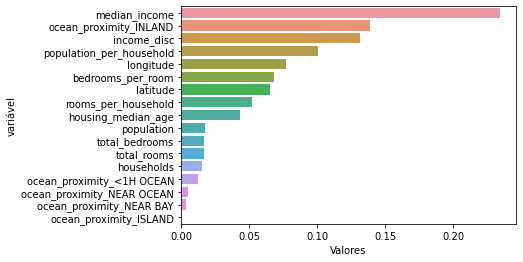

In [120]:
sns.barplot(x="Valores", y="variável", data=df_feature_importances)

### Model Tunning 

In [121]:
X_t = X[['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'income_disc', 'rooms_per_household', 'bedrooms_per_room',
       'population_per_household', 
       'ocean_proximity_INLAND']]

In [122]:
forest_regressor_t = RandomForestRegressor(max_features= 6,
                                           n_estimators= 30,
                                          n_jobs = -1)
forest_scores = cross_val_score(forest_regressor_t,  X=X_t,y=y, scoring ="neg_mean_squared_error", cv = 10)

In [123]:
forest_regressor_rmse = np.sqrt(-forest_scores)
np.mean(forest_regressor_rmse)
pct_error = np.mean(forest_regressor_rmse)/df_housing_transformed['median_house_value'].max()*100
print('{:.2f} % error'.format(pct_error))

12.61 % error


In [124]:
X_train, X_test, y_train, y_test = train_test_split(X_t, y, test_size=0.33, random_state=42)

In [125]:
forest_regressor_t.fit(X_train,y_train)

RandomForestRegressor(max_features=6, n_estimators=30, n_jobs=-1)

In [126]:
forest_regressor_t.feature_importances_

array([0.06771973, 0.06350953, 0.04319723, 0.01518916, 0.01531079,
       0.01601062, 0.01485352, 0.25277949, 0.17003131, 0.04469501,
       0.04170933, 0.1113067 , 0.14368756])

In [127]:
df_feature_importances = pd.DataFrame({'variável': X_t.columns,
                                       'Valores':forest_regressor_t.feature_importances_})
df_feature_importances =df_feature_importances.sort_values('Valores', ascending = False)
df_feature_importances

,variável,Valores
7,median_income,0.252779
8,income_disc,0.170031
12,ocean_proximity_INLAND,0.143688
11,population_per_household,0.111307
0,longitude,0.067720
1,latitude,0.063510
9,rooms_per_household,0.044695
2,housing_median_age,0.043197
10,bedrooms_per_room,0.041709
5,population,0.016011


<AxesSubplot:xlabel='Valores', ylabel='variável'>

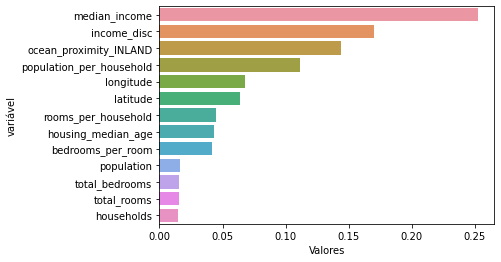

In [128]:
sns.barplot(x="Valores", y="variável", data=df_feature_importances)

# 6- Saving and exporting

In [129]:
import pickle

In [130]:
model_name = 'house_forest_basic.sav'
pickle.dump(forest_regressor_t, open(model_name, 'wb'))

In [131]:
forest_loaded = pickle.load(open('./house_forest_basic.sav','rb'))

In [132]:
predict_loaded = forest_loaded.predict(X_test)

In [133]:
predict_loaded_mse = mean_squared_error(y_test, predict_loaded)
np.sqrt(predict_loaded_mse)

50477.74742173919

In [134]:
print('{:.2f} %'.format(np.sqrt(predict_loaded_mse)/y.max()*100))

10.10 %
